# Old: Full ET analysis
This is the old version of a loooong notebook in which I originally performed the ET analyses. I'm just keeping this as a backup as it might have some useful snippets which have not yet been extracted into the more useable scripts or notebooks.  
However, everything relevant should be in the parent folder `eyetracking`. 

In [ ]:
%load_ext autoreload
%autoreload 2

import os
from multiprocessing import Pool
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
from itertools import product
from matplotlib.backends.backend_pdf import PdfPages
from scipy.ndimage import gaussian_filter
from scipy.stats import ttest_rel
from statsmodels.formula.api import glm
from statsmodels.multivariate.manova import MANOVA
from statsmodels.stats.anova import AnovaRM
from statsmodels.stats.multitest import multipletests
from tqdm.auto import tqdm
from vr2f.eyetracking import et_plot_gaze_saccades, et_utils, ms_toolbox
from vr2f.staticinfo import COLORS, CONSTANTS, PATHS, TIMINGS

paths = PATHS()
colors = COLORS()
constants = CONSTANTS()
cm = constants.CM
timings = TIMINGS()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
def plot_image(av_name, emotion, ax, invert=False, alpha=1):
  img = plt.imread(Path(paths.STIMULIIMAGES, f"{av_name}_{emotion.capitalize()}.png"))
  cutval = 205
  yOffset = 40
  im2 = img[cutval + yOffset : -cutval, cutval + int(yOffset/2) : -(cutval+int(yOffset/2)), :]
  height, width, _ = im2.shape
  # Overlay the image onto the plot, centered on the axes
  origin = "lower" if invert else "upper"
  ax.imshow(im2, extent=[-5, 5, -5, 5], alpha=alpha, origin=origin)

def ci_l(x):
  return x.mean() - 1.96 * x.std() / np.sqrt(len(x))

def ci_u(x):
  return x.mean() + 1.96 * x.std() / np.sqrt(len(x))

def get_saliency_map(fixation_df, query_str):
  # Calculate  continuous saliency maps
  # https://link.springer.com/article/10.3758/s13428-012-0226-9#Sec6 

  # create all possible combinations of theta and phi (binned in 0.1 dva)
  q_vert = np.round(np.arange(-5, 5.1, 0.1), 1)
  q_hor = q_vert.copy()
  px_df = pd.DataFrame({"center_phi_rounded": np.repeat(q_hor, len(q_vert)),
        "center_theta_rounded": np.tile(q_vert, len(q_hor))})

  fixations_binned = (fixation_df
                  .assign(center_phi_rounded = lambda x: x["center_phi"].round(1))
                  .assign(center_theta_rounded = lambda x: x["center_theta"].round(1))
                  .query(query_str)
                  .groupby(["center_phi_rounded", "center_theta_rounded"], as_index=True)
                  .size()
                  .rename("fixation_count")
                  .to_frame()
                  .reset_index()
                  .merge(px_df, how="right", on=["center_phi_rounded", "center_theta_rounded"])
                  .fillna(0)
          )

  # convolve with a gaussian kernel (sd=1; see leMeur & Baccion, 2013)
  saliency_map = (fixations_binned
                  .pivot_table(index="center_phi_rounded",
                          columns="center_theta_rounded",
                          values="fixation_count")
  )

  saliency_map = gaussian_filter(saliency_map, sigma=1)
  return(saliency_map)


def run_rmanova_and_posthoc(df_aov, depvar, within, posthoc_dim, posthoc_levels, subject="sub_id"):
    print(AnovaRM(df_aov,
                    depvar = depvar,
                    subject = subject,
                    within = within).fit())

    pairwise_comps = [(posthoc_levels[i], posthoc_levels[j]) for i in range(len(posthoc_levels))
                                                for j in range(len(posthoc_levels)) if i < j]
    posthoc_results = {}
    for tw1, tw2 in pairwise_comps:
        t_stat, p_val = ttest_rel(df_aov.query(f"{posthoc_dim} == @tw1")[depvar],
                                df_aov.query(f"{posthoc_dim} == @tw2")[depvar],
                                nan_policy="omit")
        posthoc_results[f"{tw1} vs {tw2}"] = (t_stat, p_val)

    p_vals = [p for _, p in posthoc_results.values()]
    _, p_adj, _, _ = multipletests(p_vals, method="bonferroni")
    for i, key in enumerate(posthoc_results):
        print(f"{key}: t = {posthoc_results[key][0]:.2f}, p = {p_adj[i]:.3f}")


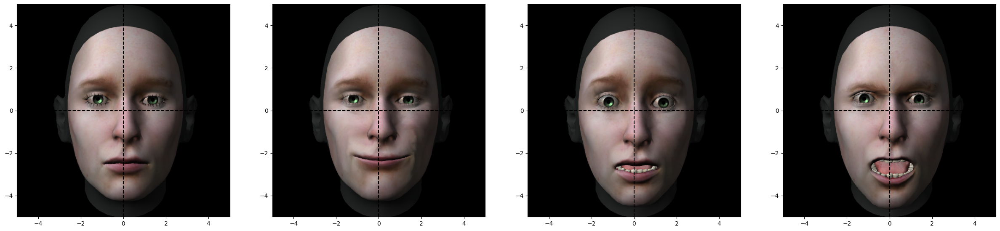

In [3]:
av_name = "Woman_08"
emotion = "neutral"
fig, ax = plt.subplots(1, 4, figsize=(30, 10))
ax = ax.ravel()
for i, emotion in enumerate(["neutral", "happy", "surprised", "angry"]):
  plot_image(av_name, emotion, ax[i], invert=False, alpha=1)
  ax[i].vlines(0, -5, 5, color="black", linestyle="--", alpha=1)
  ax[i].hlines(0, -5, 5, color="black", linestyle="--", alpha=1)


In [3]:
# read in the preprocessed data
pattern = "withoutblinks-preproc.csv"

sub_list_str_et = [f for f in os.listdir(paths.DATA_ET_PREPROC) if pattern in f]
sub_list_str_et = [f.split("-")[0] for f in sub_list_str_et]
sub_list_str_et = np.unique(sorted(sub_list_str_et))

data_preproc = []
for sub_id in sorted(sub_list_str_et):
    fname = Path(paths.DATA_ET_PREPROC, f"{sub_id}-ET-{pattern}")
    df_clean = pd.read_csv(fname, sep=",")
    df_clean["sub_id"] = sub_id
    data_preproc.append(df_clean)

df_all = pd.concat(data_preproc, ignore_index=True)

You can plot the supplementary figures to visualize the gaze and the detected saccades for specific trials like this: 

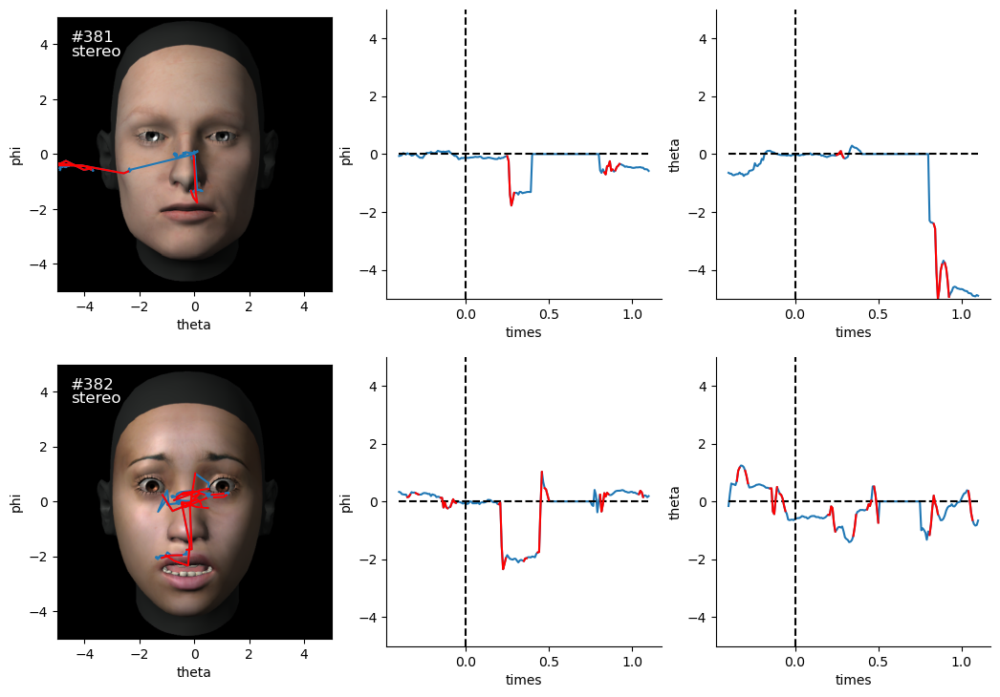

In [40]:

sub_id = "VR2FEM_S01"
trial_range = range(381, 383)


myfig = et_plot_gaze_saccades.plot_gaze_sacc_per_trial(df_all, sub_id, trial_range, sfreq=120, min_sac_amp=0)

myfig.savefig(Path(paths.FIGURES, 
                  f"gaze_saccades_{sub_id}_trial_{trial_range[0]}-{trial_range[-1]}.png"), dpi=300, bbox_inches="tight")




In [41]:
df_all.times.max

<bound method Series.max of 0         -0.400000
1         -0.391667
2         -0.383333
3         -0.375000
4         -0.366667
             ...   
2289102    1.066667
2289103    1.075000
2289104    1.083333
2289105    1.091667
2289106    1.100000
Name: times, Length: 2289107, dtype: float64>

To render the PDFs in `results/figures/ET/Gaze_saccades` with all trials for a given subject (or all of them), use the bash functionality of `et_plot_gaze_saccades.py` (ideally with the slurm script in `/code/HPC`). 

In [3]:

def get_sacc_fix_per_sub(args):
    df_all, trial_range, sub_id = args 

    print(f"Processing {sub_id}")

    sfreq = constants.SFREQ_ET
    vfac = constants.ET_SACC_VFAC
    mindur = constants.ET_SACC_MINDUR

    df_sub = df_all.query("sub_id == @sub_id").copy()
    df_gaze_subject = pd.DataFrame()

    sacs = pd.DataFrame()
    for trial_idx in tqdm(trial_range):
        df_st = et_plot_gaze_saccades.get_data_sub_trialnum(df_sub, sub_id, trial_idx)
        if df_st.empty:
            print(f"!!! Warning: No data for {sub_id} and trial {trial_idx}. Skipping this trial.")
            continue
        data = df_st.loc[:,["theta", "phi"]].to_numpy()
        sac, rad = ms_toolbox.microsacc(data, srate=sfreq, vfac=vfac, mindur=mindur)
        sac["trial_num"] = trial_idx
        sacs = pd.concat([sacs, sac], ignore_index=True)
        df_st["gaze_state"] = "fix"
        df_st["idx_fix"] = 0
        for i, row in sac.iterrows():
            onset = row["idx_onset"]
            offset = row["idx_offset"]
            df_st.loc[onset:offset+1, ["gaze_state"]] = "sacc"
            df_st.loc[onset:offset+1, ["idx_sacc"]] = i
            df_st.loc[offset:, "idx_fix"] = i+1
        df_gaze_subject = pd.concat([df_gaze_subject, df_st], ignore_index=True)
    sacs["sub_id"] = sub_id
    df_gaze_subject["idx_sacc"] = df_gaze_subject["idx_sacc"].fillna(-99)
    df_gaze_subject["idx_sacc"] = df_gaze_subject["idx_sacc"].astype(int)
    return (df_gaze_subject, sacs)

## Set up parallelization across subjects

# Choose subjects
sub_id_selection = sub_list_str_et
num_processes = len(sub_id_selection)

# Prepare input
trial_range = range(1, 745) # all trials

args_list = [(df_all, trial_range, sub_id) for sub_id in sub_id_selection]

# Run it on pool
pool = Pool(processes=num_processes)
results = pool.map(get_sacc_fix_per_sub, args_list)
pool.close()
pool.join()


NameError: name 'sub_list_str_et' is not defined

In [12]:

# Combine results for all subjects and write to disk
df_gaze = pd.concat([res[0] for res in results], ignore_index=True)
fpath = paths.DATA_ET / "02_gaze"
fpath.mkdir(exist_ok=True, parents=True)
df_gaze.to_csv(Path(fpath, "gaze_all.csv"), index=False)




## Saccades 

We do the same for the saccades DF, but first we add columns with the onset and offset time of the saccade:

In [7]:
saccades = pd.concat([res[1] for res in results], ignore_index=True)

# get sacc start and end times:
sacc_times = (df_gaze
                .query("gaze_state == 'sacc'")
                .groupby(["sub_id", "trial_num", "idx_sacc"], as_index=False)
                .agg({"times": ["first", "last"]})
                .reset_index()
             )
sacc_times.columns = list(map("".join, sacc_times.columns))
sacc_times.columns = (sacc_times.rename(columns= {"timesfirst": "times_onset", 
                                         "timeslast": "times_offset"})
                                .columns
                     )

saccades = (saccades
              .assign(idx_sacc = lambda x:
                        (x.groupby(["sub_id", "trial_num"])
                          .cumcount()
                        )
                      )
              .merge(sacc_times.drop(["index"], axis=1),
                     on=["sub_id", "trial_num", "idx_sacc"])
           )

saccades["amp_tot"] = np.sqrt(saccades["amp_x"]**2 + saccades["amp_y"]**2)
saccades["angle"] = (saccades
                      .apply(lambda x: et_utils.angle_from_spherical(x.vec_x, x.vec_y), axis=1)
)



NameError: name 'results' is not defined

In [14]:
fpath = paths.DATA_ET / "02_gaze"
fpath.mkdir(exist_ok=True, parents=True)
saccades.to_csv(Path(fpath, "saccades_all.csv"), index=False)

## Fixations

Now for fixations adding info about the fixation specs:

In [8]:

fixations = (df_gaze
  .query("gaze_state == 'fix'")
  .groupby(["sub_id", "trial_num", "gaze_state", "idx_fix"], as_index=False)
  .agg({"times": ["first", "last"],
        "theta": ["mean", "min", "max"],
        "phi": ["mean", "min", "max"]})
  .reset_index()
)
fixations.columns = list(map("".join, fixations.columns))
fixations.columns = (fixations.rename(columns={"timesfirst": "times_onset", "timeslast":
                                              "times_offset", "thetamean": "center_theta",
                                              "thetamin": "min_theta", "thetamax": "max_theta",
                                              "phimean": "center_phi", "phimin": "min_phi",
                                              "phimax": "max_phi"})
                              .columns
                    )
fixations["duration"] = fixations["times_offset"] - fixations["times_onset"]
fixations["spread_theta"] = fixations["max_theta"] - fixations["min_theta"]
fixations["spread_phi"] = fixations["max_phi"] - fixations["min_phi"]


NameError: name 'df_gaze' is not defined

In [16]:
fpath = paths.DATA_ET / "02_gaze"
fpath.mkdir(exist_ok=True, parents=True)
fixations.to_csv(Path(fpath, "fixations_all.csv"), index=False)

# Analyses

Now we run some analyses and plotting on the saccade and fixation data. 

To skip the preprocessing, saccade extraction, etc., you can directly load the data frames from disk.

In [4]:
load_data_from_disk = True

if load_data_from_disk:
    fpath = paths.DATA_ET / "02_gaze"
    saccades = pd.read_csv(Path(fpath, "saccades_all.csv"))
    fixations = pd.read_csv(Path(fpath, "fixations_all.csv"))
    df_gaze = pd.read_csv(Path(fpath, "gaze_all.csv"))

# A DF with the design matrix:
design_df = (df_gaze
              .loc[:, ["sub_id", "trial_num", "emotion", "viewcond", "avatar_id"]]
              .drop_duplicates()
)

cond_dict = {
    "viewcond": {1: "mono", 2: "stereo"},
    "emotion": {1: "neutral", 2: "happy", 3: "angry", 4: "surprised"},
    "avatar_id": {1: "Woman_01", 2: "Woman_04", 3: "Woman_08"},
}

# timing parameters:
tw_p1_start, tw_p1_end = timings.ERP_WINDOWS["P1"]
tw_n170_start, tw_n170_end = timings.ERP_WINDOWS["N170"]
tw_epn_start, tw_epn_end = timings.ERP_WINDOWS["EPN"]
tw_lpc_start, tw_lpc_end = timings.ERP_WINDOWS["LPC"]



### Plotting parameters:

In [5]:
palette = colors.COLDICT

# Set this to False if yu do not want to overwrite
save_fig = False

## Fixation analyses

First, we plot the average gaze (per participant and trial) to make sure that we did not do something horrible when subtracting these values in the fashion of "baselining" to correct for drift in the tracking (e.g. due to slippage).

/tmp/ipykernel_9551/2141843919.py:10: MatplotlibDeprecationWarning: Keeping empty pdf files is deprecated since 3.8 and support will be removed in 3.10.
  with PdfPages(Path(fpath, "gaze_baseline.pdf")) as pdf:


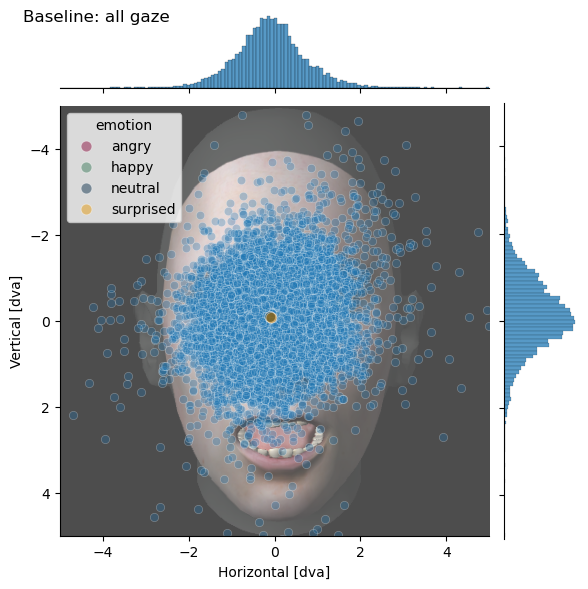

In [6]:
# A DF with the "baseline" for pitch and yaw (which we subtracted earlier):
baseline_df = (df_gaze
                .groupby(["sub_id", "trial_num"], as_index=False)
                .first()
                .loc[:, ["sub_id", "trial_num", "theta_baseline", "phi_baseline", "emotion"]]
)

# Baseline diagnostics:
fpath = Path(paths.FIGURES, "ET", "fixations", "diagnostics")
with PdfPages(Path(fpath, "gaze_baseline.pdf")) as pdf:
  g = sns.jointplot(data=baseline_df, x="theta_baseline", y="phi_baseline", palette=palette,
                    alpha=0.3)
  g.fig.axes[0].set_ylim(-5, 5)
  g.fig.axes[0].set_xlim(-5, 5)
  g.fig.axes[0].set_xlabel("Horizontal [dva]")
  g.fig.axes[0].set_ylabel("Vertical [dva]")
  g.fig.suptitle("Baseline: all gaze", x=0.05, ha="left")
  g.fig.axes[0].invert_yaxis()

  plot_image(av_name = "Woman_08", emotion = "angry", ax=g.fig.axes[0], invert=True, alpha=0.7)

  baseline_df_sum = (baseline_df
                        .groupby(["emotion"], as_index=False)
                        .agg({"theta_baseline": "mean", "phi_baseline": "mean"})
                    )
  sns.scatterplot(data=baseline_df_sum, x="theta_baseline", y="phi_baseline", hue="emotion",
                   palette=palette, ax=g.fig.axes[0], s=60, alpha=0.45)

  if save_fig:
    pdf.savefig(g.fig)



Looks pretty ok! There is some variance also during the baseline, but almost all of it takes palce within +/- 2 dva from the fixation cross. and everything (importantly also the condition averages) is neatly centered.   

Next, let's sort the fixations into three categories (as inspired by [Spiering & Dimigen, 2023](https://olaf.dimigen.de/papers/Spiering.Dimigen.2023.MicrosaccFaces.pdf)):

1. Baseline
2. First Fixation (after stimulus onset; i.e., we're not counting fixations which already started before the stimulus was visible)
3. Later fixation: all fixations which occured later in the trial 

For all fixations we enforce a minimal duration of 50ms to be counted.

In [13]:

# fixation must last at least 50ms
fix_mindur = constants.ET_FIX_MINDUR
baseline = (-1 * timings.DUR_BL, 0.0)
fixations_baseline = (fixations
                        .query("times_onset < @baseline[0] & \
                                times_onset < @baseline[1] & \
                                  duration > @fix_mindur")
                        .merge(design_df, on=["sub_id", "trial_num"])
)

# first (re-)fixation after StimOnset (i.e., after the first saccade)
fixations_first = (fixations
                    .query("times_onset > 0 & duration > @fix_mindur")
                    .groupby(["sub_id", "trial_num"], as_index=False)
                    .first()
                    .merge(design_df, on=["sub_id", "trial_num"])
)

tmp_offsets = fixations_first.loc[:,["times_offset", "trial_num"]]

# all following fixations
fixations_later = (fixations
                     .merge(tmp_offsets, on=["trial_num"], suffixes=("", "_first"))
                     .query("times_onset > times_offset_first & duration > @fix_mindur")
                     .merge(design_df, on=["sub_id", "trial_num"])
)

# all fixations incl. the one during StimOnset
fixations_stim = (fixations
                    .query("times_offset > 0 & duration > @fix_mindur")
                    .merge(design_df, on=["sub_id", "trial_num"])
)

# all fixations afterthe first sacc:
fixations_poststim = (fixations
                        .query("times_onset > 0 & duration > @fix_mindur")
                        .merge(design_df, on=["sub_id", "trial_num"])
)

# fixations overlapping with P1 window:
fixations_p1 = (fixations
                .query("times_offset > @tw_p1_start & times_onset < @tw_p1_end & duration > @fix_mindur")
                .merge(design_df, on=["sub_id", "trial_num"])
)

# fixations overlapping with N170 window:
fixations_n170 = (fixations
                .query("times_offset > @tw_n170_start & times_onset < @tw_n170_end & duration > @fix_mindur")
                .merge(design_df, on=["sub_id", "trial_num"])
)

# fixations overlapping with EPN window:
fixations_epn = (fixations
                .query("times_offset > @tw_epn_start & times_onset < @tw_epn_end & duration > @fix_mindur")
                .merge(design_df, on=["sub_id", "trial_num"])
)

# fixations overlapping with LPC window:
fixations_lpc = (fixations
                .query("times_offset > @tw_lpc_start & times_onset < @tw_lpc_end & duration > @fix_mindur")
                .merge(design_df, on=["sub_id", "trial_num"])
)

Now we can plot the fixations (per trial and emotion).

/tmp/ipykernel_104395/3681467791.py:5: MatplotlibDeprecationWarning: Keeping empty pdf files is deprecated since 3.8 and support will be removed in 3.10.
  with PdfPages(Path(fpath, "fixations_per_stage.pdf")) as pdf:
/u/fklotzsche/conda-envs/vr2fem/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)


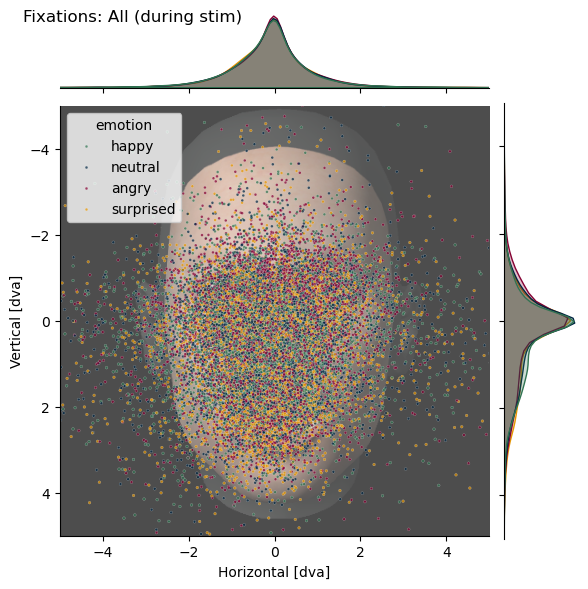

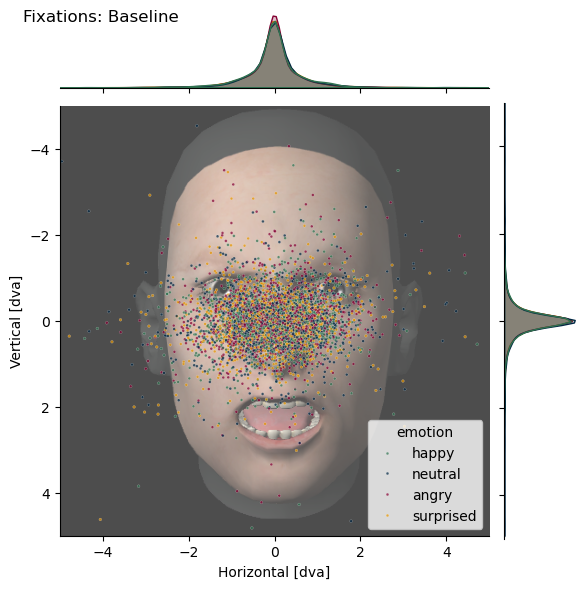

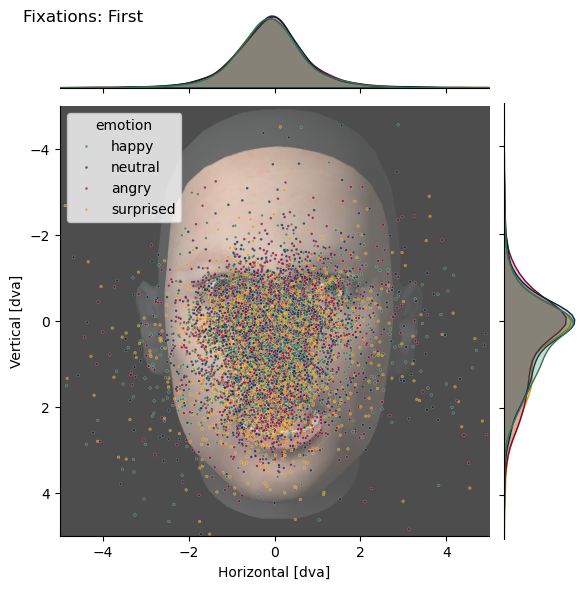

/u/fklotzsche/conda-envs/vr2fem/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


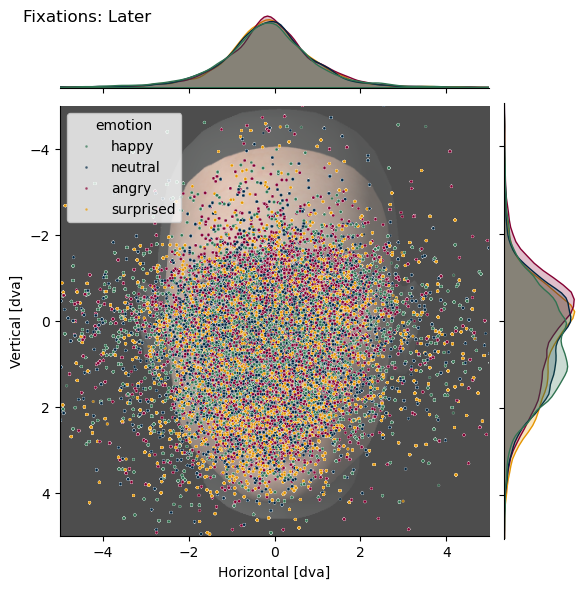

In [7]:
# Fixation diagnostics
fpath = Path(paths.FIGURES, "ET", "fixations")
fpath.mkdir(parents=True, exist_ok=True)

with PdfPages(Path(fpath, "fixations_per_stage.pdf")) as pdf:
  for df, title in zip((fixations_stim, fixations_baseline, fixations_first, fixations_later),
                       ("All (during stim)", "Baseline", "First", "Later"), strict=True):
    g = sns.jointplot(data=df, x="center_theta", y="center_phi", hue="emotion", palette=palette,
                      alpha=0.7, kind="scatter", s=4)
    g.fig.suptitle(f"Fixations: {title}", x=0.05, ha="left")
    g.fig.axes[0].set_ylim(-5, 5)
    g.fig.axes[0].set_xlim(-5, 5)
    g.fig.axes[0].set_xlabel("Horizontal [dva]")
    g.fig.axes[0].set_ylabel("Vertical [dva]")
    g.fig.axes[0].invert_yaxis()

    plot_image(av_name = "Woman_04", emotion = "angry", ax=g.fig.axes[0], invert=True, alpha=0.7)

    if save_fig:
      pdf.savefig(g.fig)


This gives a useful first overview.  
1. Baselining did what it was supposed to do.
2. The first fixations are spread out in the eyes-to-mouth region. 
3. later fixations cover the entire face.
4. Anything "interesting" in contrasting emotion condition seems to happen along the vertical axis. 

Let us now plot heat maps separately for each emotion condition:


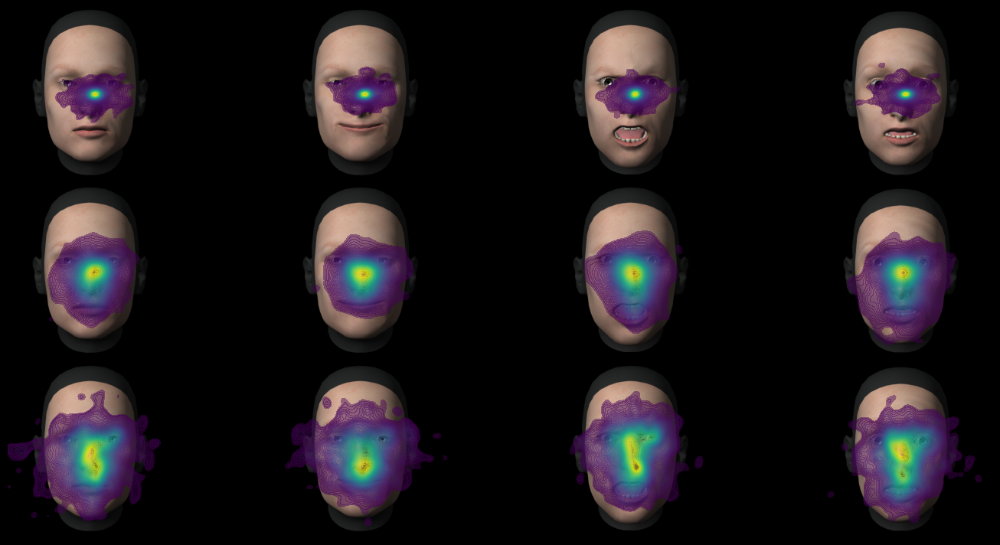

In [8]:
# sub_id_plt = "VR2FEM_S10"
img = plt.imread(Path(paths.STIMULIIMAGES, "Woman_08_Angry.png"))
im2 = img[245:-245, 245:-245, :]
height, width, _ = im2.shape

fig, axs = plt.subplots(3, 4, figsize=(18, 9))
# set the figure background to black
fig.patch.set_facecolor("black")
fig.patch.set_alpha(1.0)
# set the axes background to black
for ax in axs.flatten():
    ax.patch.set_facecolor("black")
    ax.patch.set_alpha(1.0)
# reduce the space between the subplots
fig.subplots_adjust(hspace=0.02, wspace=0.05)

for time_idx, data_fix in enumerate([fixations_baseline, fixations_first, fixations_later]):  
    for av_idx, av_name in enumerate(list(cond_dict["avatar_id"].values())[1:2]):  # noqa: B007
        for emo_idx, emotion in enumerate(cond_dict["emotion"].values()):
            ax = axs[time_idx, emo_idx]
            data_plot = (
                data_fix
                .query("emotion == @emotion")
                .query("avatar_id == @av_name")
                # .query("viewcond == @viewcond")
                # .query(f"sub_id == '{sub_id_plt}'")
            )

            # flip phi so that negative angles go downwards
            data_plot["center_phi"] = data_plot["center_phi"].apply(lambda x: x * -1)

            g = sns.kdeplot(
                data=data_plot,
                x="center_theta",
                y="center_phi",
                fill=True,
                cmap="viridis",
                levels=100,
                thresh=0.05,
                alpha=0.45,
                ax=ax,
            )

            ax.invert_yaxis()

            img = plt.imread(Path(paths.STIMULIIMAGES, f"{av_name}_{emotion.capitalize()}.png"))
            cutval = 205
            im2 = img[cutval + 35 : -cutval, cutval + 35 : -cutval, :]
            height, width, _ = im2.shape
            # Overlay the image onto the plot, centered on the axes
            ax.imshow(im2, extent=[-5, 5, -5, 5], alpha=1)
            # hide the axes and the ticks and labels
            ax.axis("off")

# save as pdf
fpath = Path(paths.FIGURES, "ET", "fixations")
if not fpath.exists():
    fpath.mkdir(parents=True)
plt.savefig(Path(fpath, f"fixations_heatmaps_all.pdf"), dpi=300, bbox_inches="tight", pad_inches=0)

Nice! It looks like especially the later (2nd onwards) fixations make a difference between the emotion conditions.

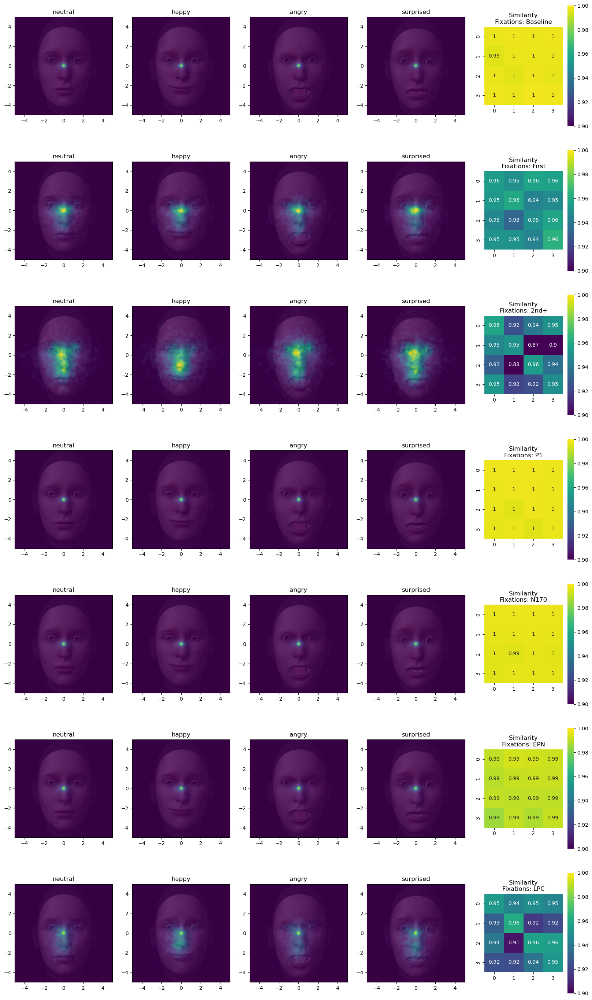

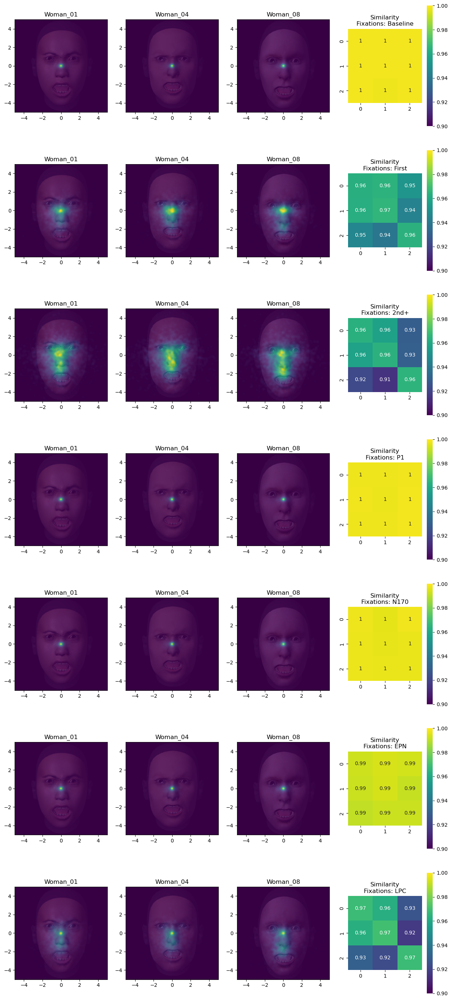

In [16]:
save_fig = True

cond_dict = constants.COND_DICT
fix_data = [fixations_baseline,
            fixations_first,
            fixations_later,
            fixations_p1,
            fixations_n170,
            fixations_epn,
            fixations_lpc
           ]
titles = ["Baseline",
          "First",
          "2nd+",
          "P1",
          "N170",
          "EPN",
          "LPC"
         ]

viewconds = list(cond_dict["viewcond"].values())

for target in ["emotion", "avatar_id"]:
  values = cond_dict[target].values()

  fig, axs = plt.subplots(len(titles), len(values)+1, figsize=(5*len(values), 5*len(titles)))

  for i, f_df in enumerate(fix_data):
    smap_dict = {vc: {} for vc in viewconds}
    for j, emo in enumerate(values):
      ax = axs[i, j]
      saliency_maps = {vc: [] for vc in viewconds}
      for sub_id in f_df["sub_id"].unique():
        for vc in viewconds:
          q_str = f"{target} == '{emo}' & sub_id == '{sub_id}' & viewcond == '{vc}'"
          smap = get_saliency_map(f_df, q_str)
          saliency_maps[vc].append(smap)

      saliency_map = {}
      for vc in viewconds:
        saliency_map[vc] = np.mean(np.array(saliency_maps[vc]), axis=0)

      # plot avg across viewing conditions as heatmap
      saliency_map_avg = np.mean(np.array(list(saliency_map.values())), axis=0)
      ax.imshow(saliency_map_avg, cmap="viridis", origin="lower", extent=(-5, 5, 5, -5))
      ax.set_title(emo)

      if target == "emotion":
        plot_image("Woman_08", emo, ax, invert=False, alpha=0.2)
      elif target == "avatar_id":
        plot_image(emo, "angry", ax, invert=False, alpha=0.2)

      for vc in viewconds:
        smap_dict[vc][emo] = saliency_map[vc].flatten()
        smap_dict[emo] = np.corrcoef(saliency_map["mono"].flatten(),
                                     saliency_map["stereo"].flatten())[0,1]

    # calc corr matrix between saliency maps
    smap_corr = {}
    for vc in viewconds:
      smap_df = pd.DataFrame(smap_dict[vc])
      smap_corr[vc] = smap_df.corr()
    smap_corr_plt = smap_corr[viewconds[0]].to_numpy()
    idx_upper_tri = np.triu_indices_from(smap_corr_plt, k=1)
    idx_lower_tri = np.tril_indices_from(smap_corr_plt, k=-1)
    idx_diag = np.diag_indices_from(smap_corr_plt)
    smap_corr_plt[idx_upper_tri] = smap_corr[viewconds[1]].to_numpy()[idx_upper_tri]
    smap_corr_plt[idx_diag] = [smap_dict[e] for e in cond_dict[target].values()]
    p = sns.heatmap(smap_corr_plt, annot=True, cmap="viridis", vmin=0.9, vmax=1.0,
                    ax=axs[i, len(values)], square=True)
    axs[i, len(values)].set_title(f"Similarity\nFixations: {titles[i]}")

    # save as pdf
    fpath = Path(paths.FIGURES, "ET", "fixations")
    if save_fig:
      if not fpath.exists():
        fpath.mkdir(parents=True)
      plt.savefig(Path(fpath, f"fixations_saliencymaps_per_{target}.pdf"), dpi=300,
                      bbox_inches="tight", pad_inches=0)

In the following, we run the same analysis and create the same plot with the difference that we calculate the correlation between the heatmaps (e.g., for different emotions) on the single-subject level and average afterwards the correlation coefficients (instead of averqaging first and running one correlation): 
The heatmap plots are the same, but the similarity matrices look different. 

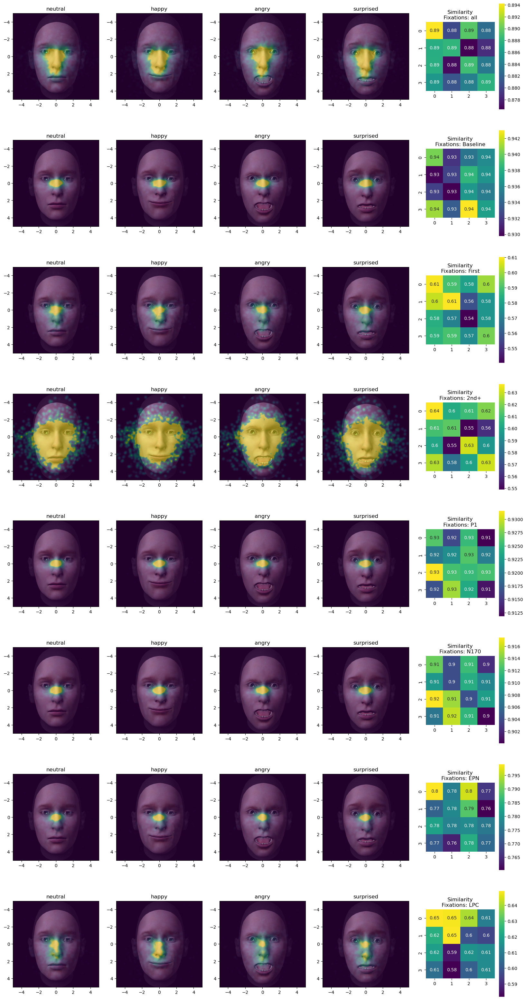

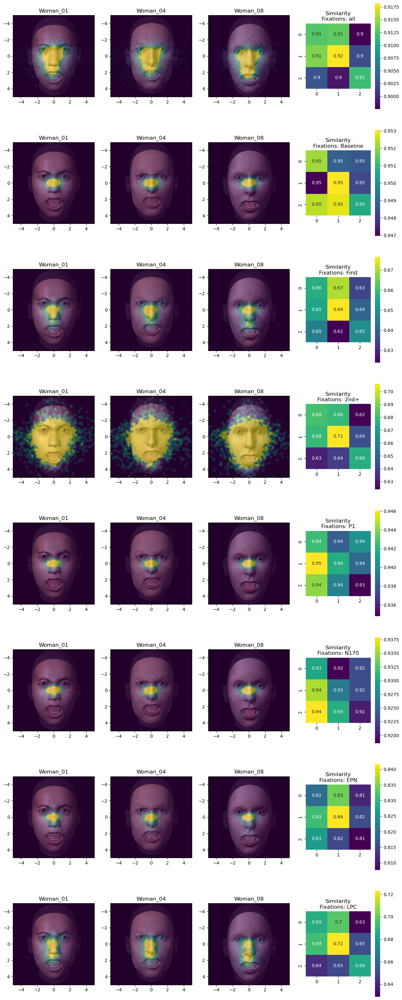

In [62]:
save_fig = True

cond_dict = constants.COND_DICT
fix_data = [fixations_stim,
            fixations_baseline,
            fixations_first,
            fixations_later,
            fixations_p1,
            fixations_n170,
            fixations_epn,
            fixations_lpc
           ]
titles = ["all",
          "Baseline",
          "First",
          "2nd+",
          "P1",
          "N170",
          "EPN",
          "LPC"
         ]

viewconds = list(cond_dict["viewcond"].values())

for target in ["emotion", "avatar_id"]:
  values = cond_dict[target].values()

  fig, axs = plt.subplots(len(titles), len(values)+1, figsize=(5*len(values), 5*len(titles)))

  for i, f_df in enumerate(fix_data):
    smap_dict = {vc: {} for vc in viewconds}
    smap_dict_indiv = {vc: [] for vc in viewconds}
    for j, emo in enumerate(values):
      ax = axs[i, j]
      saliency_maps = {vc: [] for vc in viewconds}
      for sub_id in np.sort(f_df["sub_id"].unique()):
        for vc in viewconds:
          q_str = f"{target} == '{emo}' & sub_id == '{sub_id}' & viewcond == '{vc}'"
          smap = get_saliency_map(f_df, q_str)
          saliency_maps[vc].append(smap)

      saliency_map = {}
      saliency_map_indiv = {}
      for vc in viewconds:
        saliency_map[vc] = np.mean(np.array(saliency_maps[vc]), axis=0)
        saliency_map_indiv[vc] = saliency_maps[vc]

      if target == "emotion":
        plot_image("Woman_08", emo, ax, invert=True) # , alpha=0.2)
      elif target == "avatar_id":
        plot_image(emo, "angry", ax, invert=True) # , alpha=0.2)

      # plot avg across viewing conditions as heatmap
      saliency_map_avg = np.mean(np.array(list(saliency_map.values())), axis=0)
      ax.imshow(saliency_map_avg,
                cmap="viridis",
                origin="upper",
                extent=(-5, 5, 5, -5),
                vmin=0, vmax=0.2,
                alpha=0.5)
      ax.set_title(emo)



      for vc in viewconds:
        smap_dict[vc][emo] = saliency_map[vc].flatten()
        smap_dict[emo] = np.corrcoef(saliency_map["mono"].flatten(),
                                     saliency_map["stereo"].flatten())[0,1]
        corrs = []
        for sub_id in range(len(saliency_map_indiv[vc])):
          if len(smap_dict_indiv[vc]) < sub_id+1:
            smap_dict_indiv[vc].append({})
          smap_dict_indiv[vc][sub_id][emo] = saliency_map_indiv[vc][sub_id].flatten()
          corrs.append(np.corrcoef(saliency_map_indiv["mono"][sub_id].flatten(),
                                   saliency_map_indiv["stereo"][sub_id].flatten())[0,1])
        smap_dict[emo] = np.mean(corrs)
    # calc corr matrix between saliency maps
    smap_corr = {}
    for vc in viewconds:
      smap_df = pd.DataFrame(smap_dict[vc])
      smap_corr[vc] = smap_df.corr()
      corrmaps_indiv = []
      for sub_i in range(len(smap_dict_indiv[vc])):
        smap_df = pd.DataFrame(smap_dict_indiv[vc][sub_i])
        corrmaps_indiv.append(smap_df.corr())
      smap_corr[vc] = pd.DataFrame(np.mean(np.array(corrmaps_indiv), axis=0))
    smap_corr_plt = smap_corr[viewconds[0]].to_numpy()
    idx_upper_tri = np.triu_indices_from(smap_corr_plt, k=1)
    idx_lower_tri = np.tril_indices_from(smap_corr_plt, k=-1)
    idx_diag = np.diag_indices_from(smap_corr_plt)
    smap_corr_plt[idx_upper_tri] = smap_corr[viewconds[1]].to_numpy()[idx_upper_tri]
    smap_corr_plt[idx_diag] = [smap_dict[e] for e in cond_dict[target].values()]
    p = sns.heatmap(smap_corr_plt,
                    annot=True,
                    cmap="viridis",
                    #vmin=0.9, vmax=1.0,
                    ax=axs[i, len(values)],
                    square=True)
    axs[i, len(values)].set_title(f"Similarity\nFixations: {titles[i]}")

    # save as pdf
    fpath = Path(paths.FIGURES, "ET", "fixations")
    if save_fig:
      if not fpath.exists():
        fpath.mkdir(parents=True)
      plt.savefig(Path(fpath, f"fixations_saliencymaps_per_{target}_singlesub-corrs.pdf"), dpi=300,
                      bbox_inches="tight", pad_inches=0)

 For convenience (speed) here we only plot 2 timewindows:

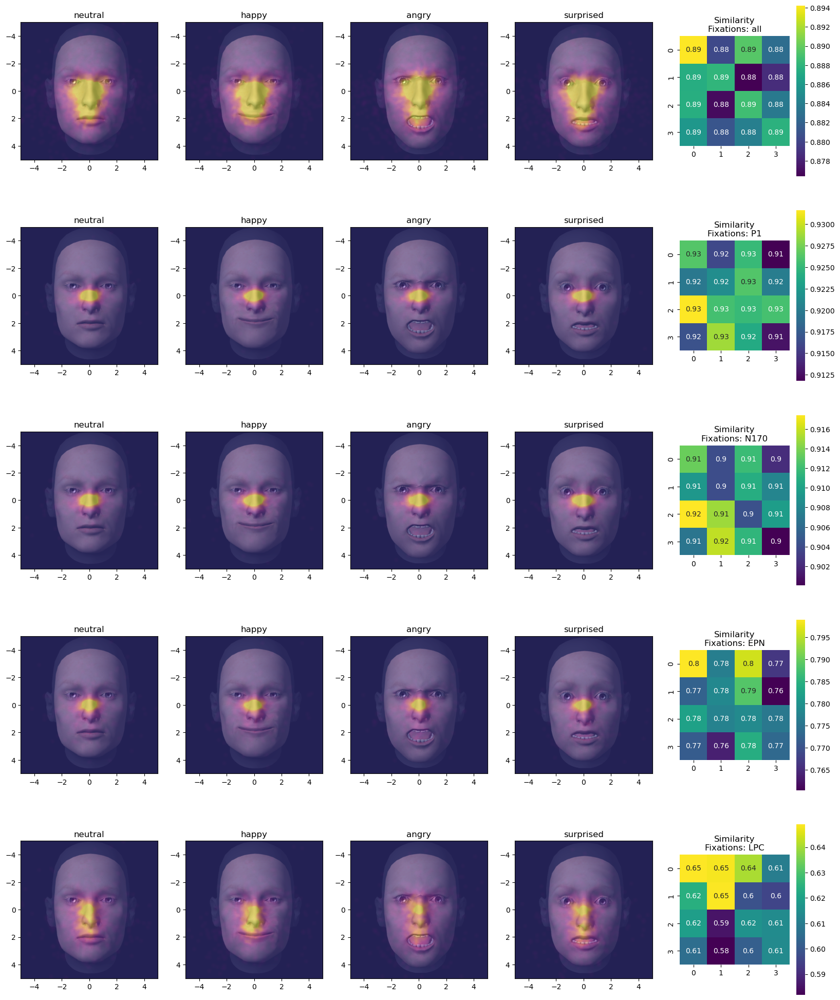

In [14]:
save_fig = True

cond_dict = constants.COND_DICT
fix_data = [fixations_stim,
            fixations_p1,
            fixations_n170,
            fixations_epn,
            fixations_lpc,
           ]
titles = ["all",
          "P1",
          "N170",
          "EPN",
          "LPC"
         ]

viewconds = list(cond_dict["viewcond"].values())

for target in ["emotion"]: # , "avatar_id"]:
  values = cond_dict[target].values()

  fig, axs = plt.subplots(len(titles), len(values)+1, figsize=(5*len(values), 5*len(titles)))

  for i, f_df in enumerate(fix_data):
    smap_dict = {vc: {} for vc in viewconds}
    smap_dict_indiv = {vc: [] for vc in viewconds}
    for j, emo in enumerate(values):
      ax = axs[i, j]
      saliency_maps = {vc: [] for vc in viewconds}
      for sub_id in np.sort(f_df["sub_id"].unique()):
        for vc in viewconds:
          q_str = f"{target} == '{emo}' & sub_id == '{sub_id}' & viewcond == '{vc}'"
          smap = get_saliency_map(f_df, q_str)
          saliency_maps[vc].append(smap)

      saliency_map = {}
      saliency_map_indiv = {}
      for vc in viewconds:
        saliency_map[vc] = np.mean(np.array(saliency_maps[vc]), axis=0)
        saliency_map_indiv[vc] = saliency_maps[vc]

      if target == "emotion":
        plot_image("Woman_04", emo, ax, invert=True, alpha=0.8)
      elif target == "avatar_id":
        plot_image(emo, "angry", ax, invert=True, alpha=0.8)

      # plot avg across viewing conditions as heatmap
      saliency_map_avg = np.mean(np.array(list(saliency_map.values())), axis=0)
      #mask = saliency_map_avg < 0.05
      #saliency_map_avg = np.ma.masked_where(saliency_map_avg < 0.05, saliency_map_avg)
      ax.imshow(saliency_map_avg,
                cmap="plasma",
                origin="upper",
                extent=(-5, 5, 5, -5),
                vmin=0,
                vmax=0.2,
                alpha=0.4)
      ax.set_title(emo)



      for vc in viewconds:
        smap_dict[vc][emo] = saliency_map[vc].flatten()
        smap_dict[emo] = np.corrcoef(saliency_map["mono"].flatten(),
                                     saliency_map["stereo"].flatten())[0,1]
        corrs = []
        for sub_id in range(len(saliency_map_indiv[vc])):
          if len(smap_dict_indiv[vc]) < sub_id+1:
            smap_dict_indiv[vc].append({})
          smap_dict_indiv[vc][sub_id][emo] = saliency_map_indiv[vc][sub_id].flatten()
          corrs.append(np.corrcoef(saliency_map_indiv["mono"][sub_id].flatten(),
                                   saliency_map_indiv["stereo"][sub_id].flatten())[0,1])
        smap_dict[emo] = np.mean(corrs)
    # calc corr matrix between saliency maps
    smap_corr = {}
    for vc in viewconds:
      smap_df = pd.DataFrame(smap_dict[vc])
      smap_corr[vc] = smap_df.corr()
      corrmaps_indiv = []
      for sub_i in range(len(smap_dict_indiv[vc])):
        smap_df = pd.DataFrame(smap_dict_indiv[vc][sub_i])
        corrmaps_indiv.append(smap_df.corr())
      smap_corr[vc] = pd.DataFrame(np.mean(np.array(corrmaps_indiv), axis=0))
    smap_corr_plt = smap_corr[viewconds[0]].to_numpy()
    idx_upper_tri = np.triu_indices_from(smap_corr_plt, k=1)
    idx_lower_tri = np.tril_indices_from(smap_corr_plt, k=-1)
    idx_diag = np.diag_indices_from(smap_corr_plt)
    smap_corr_plt[idx_upper_tri] = smap_corr[viewconds[1]].to_numpy()[idx_upper_tri]
    smap_corr_plt[idx_diag] = [smap_dict[e] for e in cond_dict[target].values()]
    p = sns.heatmap(smap_corr_plt, annot=True, cmap="viridis", #vmin=0.9, vmax=1.0,
                    ax=axs[i, len(values)], square=True)
    axs[i, len(values)].set_title(f"Similarity\nFixations: {titles[i]}")

    # save as pdf
    fpath = Path(paths.FIGURES, "ET", "fixations")
    if save_fig:
      if not fpath.exists():
        fpath.mkdir(parents=True)
      plt.savefig(Path(fpath, f"fixations_saliencymaps_per_{target}_singlesub-corrs_plasma.pdf"), dpi=300,
      bbox_inches="tight", pad_inches=0)

In [18]:
fig.show()

In [15]:
fpath = Path(paths.FIGURES, "ET", "fixations")
if save_fig:
  if not fpath.exists():
    fpath.mkdir(parents=True)
  plt.savefig(Path(fpath, f"fixations_saliencymaps_per_emotion_singlesub-corrs_plasma.png"), dpi=300,
  bbox_inches="tight", pad_inches=0)

<Figure size 640x480 with 0 Axes>

In [6]:
fixations_p1_mean = (fixations_p1
                      .groupby(["sub_id", "emotion", "viewcond"], as_index=False)
                      .agg({"center_theta": "mean", "center_phi": "mean"})
                      .assign(time_window = "p1")
)

fixations_n170_mean = (fixations_n170
                      .groupby(["sub_id", "emotion", "viewcond"], as_index=False)
                      .agg({"center_theta": "mean", "center_phi": "mean"})
                      .assign(time_window = "n170")
)

fixations_epn_mean = (fixations_epn
                      .groupby(["sub_id", "emotion", "viewcond"], as_index=False)
                      .agg({"center_theta": "mean", "center_phi": "mean"})
                      .assign(time_window = "epn")
)

fixations_lpc_mean = (fixations_lpc
                      .groupby(["sub_id", "emotion", "viewcond"], as_index=False)
                      .agg({"center_theta": "mean", "center_phi": "mean"})
                      .assign(time_window = "lpc")
)

fixations_all_mean = pd.concat([fixations_p1_mean, fixations_n170_mean,
                                fixations_epn_mean, fixations_lpc_mean], ignore_index=True)



<Axes: xlabel='time_window', ylabel='center_theta'>

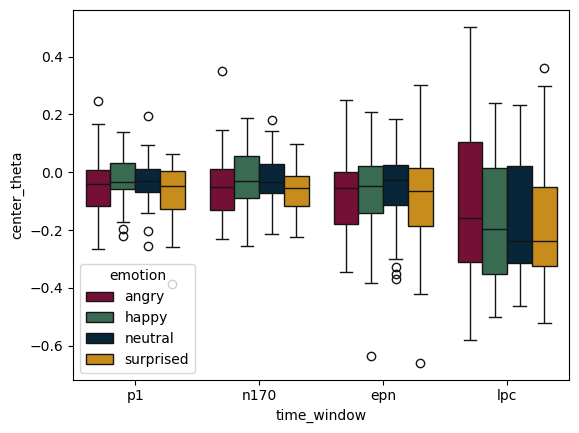

In [12]:
sns.boxplot(data=fixations_all_mean, x="time_window", y="center_theta", hue="emotion", palette=palette)


<Axes: xlabel='time_window', ylabel='fix_pos_vertical'>

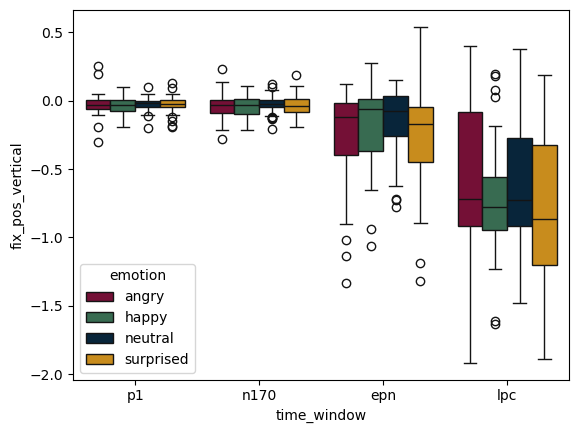

In [28]:
sns.boxplot(data=fixations_all_mean.assign(fix_pos_vertical=lambda x: x["center_phi"] * -1),
                                           x="time_window",
                                           y="fix_pos_vertical",
                                           hue="emotion",
                                           palette=palette)

Modelling the avg. fixation coordiantes (2D) as a function of Emotion, Viewing Condition, and Time Window:

In [6]:


formula_emo_vc_tw = "center_theta + center_phi ~ C(emotion, Treatment('neutral')) * C(viewcond) * C(time_window, Treatment('p1'))"
model_emo_vc_tw = MANOVA.from_formula(formula_emo_vc_tw, data=fixations_all_mean, family=sm.families.Gaussian())
maov_res = model_emo_vc_tw.mv_test()
print(maov_res)


NameError: name 'fixations_all_mean' is not defined

In [26]:
# horizontal gaze:
erp_windows = timings.ERP_WINDOWS
time_wins = list(erp_windows.keys())
time_wins = [tw.lower() for tw in time_wins]

run_rmanova_and_posthoc(df_aov=fixations_all_mean,
                        depvar="center_phi",
                        within=["emotion", "viewcond", "time_window"],
                        posthoc_dim="time_window",
                        posthoc_levels=time_wins,
                        subject="sub_id")


NameError: name 'fixations_all_mean' is not defined

In [62]:
# vertical gaze:
run_rmanova_and_posthoc(df_aov=fixations_all_mean,
                        depvar="center_theta",
                        within=["emotion", "viewcond", "time_window"],
                        posthoc_dim="time_window",
                        posthoc_levels=time_wins,
                        subject="sub_id")

                           Anova
                             F Value Num DF  Den DF  Pr > F
-----------------------------------------------------------
emotion                       1.4944 3.0000  48.0000 0.2280
viewcond                      1.2108 1.0000  16.0000 0.2874
time_window                   4.6208 3.0000  48.0000 0.0064
emotion:viewcond              0.1960 3.0000  48.0000 0.8986
emotion:time_window           1.9464 9.0000 144.0000 0.0499
viewcond:time_window          0.5791 3.0000  48.0000 0.6316
emotion:viewcond:time_window  0.4030 9.0000 144.0000 0.9318

p1 vs n170: t = 0.21, p = 1.000
p1 vs epn: t = 3.26, p = 0.009
p1 vs lpc: t = 5.88, p = 0.000
n170 vs epn: t = 3.67, p = 0.002
n170 vs lpc: t = 5.99, p = 0.000
epn vs lpc: t = 4.31, p = 0.000


## Saccades

We first plot the a circular histogram ("polar shot") of the detected saccades — we then do the same for each emotion condition separately, to get an impression whether they differ. 

In [7]:
sacc_minamp = constants.ET_SACC_MINAMP
baseline = (-1 * timings.DUR_BL, 0.0)


saccades_baseline = (saccades
                        .query("times_onset < @baseline[0] & \
                                times_onset < @baseline[1] & \
                                  amp_tot > @sacc_minamp")
                        .merge(design_df, on=["sub_id", "trial_num"])
)

saccades_first = (saccades
                    .query("times_onset > 0 & amp_tot > @sacc_minamp")
                    .groupby(["sub_id", "trial_num"], as_index=False)
                    .first()
                    .merge(design_df, on=["sub_id", "trial_num"])
)

tmp_offsets = saccades_first.loc[:,["times_offset", "trial_num"]]

saccades_later = (saccades
                     .merge(tmp_offsets, on=["trial_num"], suffixes=("", "_first"))
                     .query("times_onset > times_offset_first & amp_tot > @sacc_minamp")
                     .merge(design_df, on=["sub_id", "trial_num"])
)

saccades_p1 = (saccades
                .query("times_offset > @tw_p1_start & times_onset < @tw_p1_end & amp_tot > @sacc_minamp")
                .merge(design_df, on=["sub_id", "trial_num"])
)

saccades_n170 = (saccades
                .query("times_offset > @tw_n170_start & times_onset < @tw_n170_end & amp_tot > @sacc_minamp")
                .merge(design_df, on=["sub_id", "trial_num"])
)

saccades_epn = (saccades
                .query("times_offset > @tw_epn_start & times_onset < @tw_epn_end & amp_tot > @sacc_minamp")
                .merge(design_df, on=["sub_id", "trial_num"])
)

saccades_lpc = (saccades
                .query("times_offset > @tw_lpc_start & times_onset < @tw_lpc_end & amp_tot > @sacc_minamp")
                .merge(design_df, on=["sub_id", "trial_num"])
)

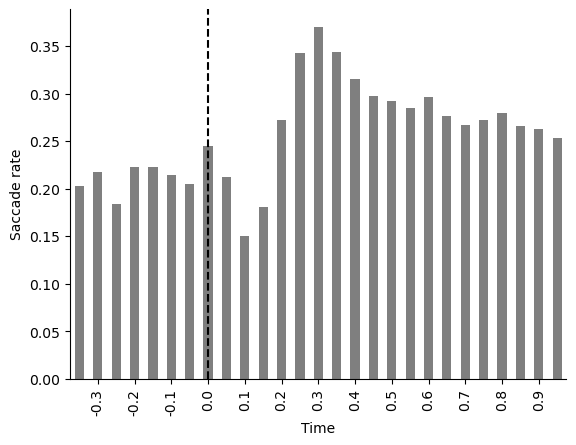

In [8]:
# plot  saccade density over time

# make bins of 20ms width
sacc_bins = np.arange(-0.375, 1.0, 0.05)

saccades["bin"] = pd.cut(saccades["times_onset"], bins=sacc_bins)
saccades["bin_center"] = saccades["bin"].apply(lambda x: x.mid.round(4))
ax = saccades.groupby(["bin_center", "sub_id", "trial_num"], observed=False).size().groupby("bin_center", observed=True).mean().plot(kind="bar", color="black", alpha=0.5)
# Set the number of yticks
num_ticks = 10  # Set the desired number of ticks
xmin, xmax = ax.get_xlim()  # Get the current x-axis limits
oldticks = ax.get_xticks()  # Get the current x-ticks
old_labs = ax.get_xticklabels()  # Get the current x-tick labels

newticks = oldticks[1::2]
newlabs = old_labs[1::2]

ax.set_xticks(newticks)  # Apply the yticks to the plot
# add vline at zero
ax.axvline(newticks[[float(nl.get_text()) == 0 for nl in newlabs]], color="black", linestyle="--")
ax.set_xlabel("Time")
ax.set_ylabel("Saccade rate")
# rm splines
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
plt.show()

In [9]:
def plot_saccrate(saccades, color="black"):
  sacc_bins = np.arange(-0.375, 1.0, 0.05)

  saccades["bin"] = pd.cut(saccades["times_onset"], bins=sacc_bins)
  saccades["bin_center"] = saccades["bin"].apply(lambda x: x.mid.round(4))
  ax = saccades.groupby(["bin_center", "sub_id", "trial_num"], observed=False).size().groupby("bin_center", observed=True).mean().plot(kind="bar", color=color, alpha=0.5)

  dat_emo = saccades.groupby(["bin_center", "sub_id", "trial_num", "emotion"], observed=False).size().groupby(["emotion", "bin_center"], observed=True).mean().reset_index()
  print(dat_emo.loc[dat_emo.emotion == "happy", 0])
  ax.plot(dat_emo.loc[dat_emo.emotion == "happy", 0].reset_index(), color=color, alpha=0.5)

  oldticks = ax.get_xticks()  # Get the current x-ticks
  old_labs = ax.get_xticklabels()  # Get the current x-tick labels

  newticks = oldticks[1::2]
  newlabs = old_labs[1::2]

  ax.set_xticks(newticks)  # Apply the yticks to the plot
  # add vline at zero
  ax.axvline(newticks[[float(nl.get_text()) == 0 for nl in newlabs]], color="black", linestyle="--")
  ax.set_xlabel("Time")
  ax.set_ylabel("Saccade rate")
  # rm splines
  ax.spines["top"].set_visible(False)
  ax.spines["right"].set_visible(False)
  plt.show()

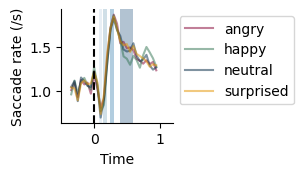

In [10]:
sacc_c = saccades.copy().merge(design_df, on=["sub_id", "trial_num"])
sacc_bins = np.arange(-0.375, 1.0, 0.05)

sacc_c["bin"] = pd.cut(sacc_c["times_onset"], bins=sacc_bins)
sacc_c["bin_center"] = sacc_c["bin"].apply(lambda x: x.mid.round(4))

data_plt = sacc_c.groupby(["bin_center", "sub_id", "trial_num", "emotion"], observed=False).size().groupby(["bin_center", "emotion"], observed=True).mean().to_frame("sacc_rate").reset_index()


fig, ax = plt.subplots(1, 1, 
                       figsize=(2.43 * cm * 1.5 , 2.49 * cm * 1.5 )
                       )
data_plt["sacc_rate"] = data_plt["sacc_rate"] / 0.05  # convert to Hz
sns.lineplot(data=data_plt, x="bin_center", y="sacc_rate", hue="emotion", palette=palette, alpha=0.5, ax=ax)
oldticks = ax.get_xticks()  # Get the current x-ticks
old_labs = ax.get_xticklabels()  # Get the current x-tick labels

newticks = oldticks[1::2]
newlabs = old_labs[1::2]

# ax.set_xticks(newticks)  # Apply the yticks to the plot
# # add vline at zero

# print(np.where([float(nl.get_text()) == 0 for nl in newlabs])[0][0])

# print([float(nl.get_text()) == 0 for nl in newlabs])
# ax.axvline(newticks[np.where([float(nl.get_text()) == 0 for nl in newlabs])[0][0]], color="black", linestyle="--")
ax.set_xlabel("Time")
ax.set_ylabel("Saccade rate (/s)")
# rm splines
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.axvline(0, color="black", linestyle="--")

ax.set_xlim(-0.5, 1.2)

#remove box around legend
ax.legend(frameon=False)
# rm legend title
ax.get_legend().set_title("")

# hide legend
#ax.get_legend().remove()

# # move legend outside the plot
ax.legend(loc="upper left", bbox_to_anchor=(1, 1), bbox_transform=ax.transAxes)


# add a semi-transparent box for the epn window
colors = COLORS()
ax.axvspan(*timings.ERP_WINDOWS["P1"], color=colors.COLDICT["P1"] , alpha=0.3, linewidth=0)
ax.axvspan(*timings.ERP_WINDOWS["N170"], color=colors.COLDICT["N170"] , alpha=0.3, linewidth=0)
ax.axvspan(*timings.ERP_WINDOWS["EPN"], color=colors.COLDICT["EPN"] , alpha=0.3, linewidth=0)
ax.axvspan(*timings.ERP_WINDOWS["LPC"], color=colors.COLDICT["LPC"] , alpha=0.3, linewidth=0)

fig.savefig(
    Path(paths.FIGURES, "saccade-rate_emo-all.pdf"),
    transparent=True,  bbox_inches="tight"
)

/tmp/ipykernel_104395/3593692545.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sacc_plt = saccades.groupby(["bin_center"]).agg({"amp_tot": "count"}).reset_index()


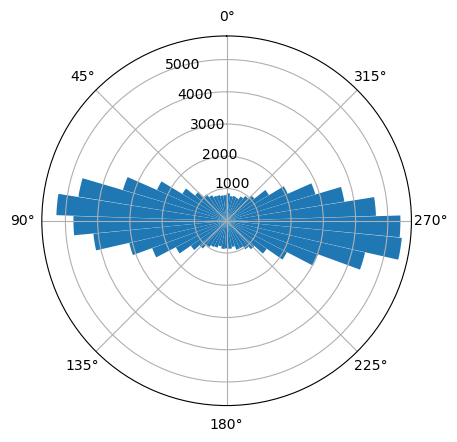

In [13]:
ax = plt.subplot(111, polar=True)

# bin the saccades in 50 bins
bins = np.linspace(0, 2*np.pi, 50)
saccades["angle_bin"] = pd.cut(saccades["angle"], bins, right=False)
saccades["bin_center"] = saccades["angle_bin"].apply(lambda x: x.mid)
sacc_plt = saccades.groupby(["bin_center"]).agg({"amp_tot": "count"}).reset_index()
bars = ax.bar(sacc_plt["bin_center"], sacc_plt["amp_tot"], bottom=0, width=(2*np.pi / 50))
ax.set_theta_offset(np.pi/2)


/tmp/ipykernel_91109/3043515443.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sacc_plt = (sacc_data_plt
/tmp/ipykernel_91109/3043515443.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sacc_plt = (sacc_data_plt
/tmp/ipykernel_91109/3043515443.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sacc_plt = (sacc_data_plt
/tmp/ipykernel_91109/3043515443.py:26: FutureWarning: The default of observed=False is depr

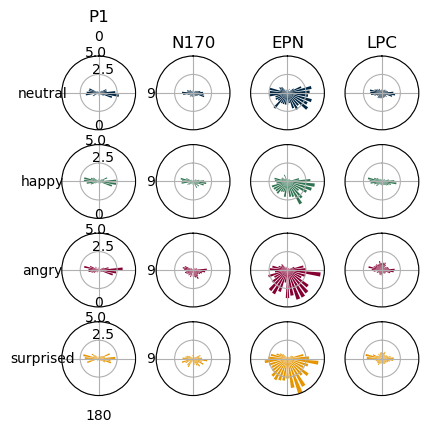

In [95]:
ylims_stage = [#(0, 80),  # baseline
               #(0, 175),  # first sacc
               #(0, 3500),  # later sacc
               (0, 5),
               (0, 5),
               (0, 5),
               (0, 5)
              ]

fig, axs = plt.subplots(len(ylims_stage),4, subplot_kw=dict(polar=True), figsize=(4.67, 4.41))
stage_names = ["P1", "N170", "EPN", "LPC"]

for idx_stage, sacc_data in enumerate([#saccades_baseline,
                                       #saccades_first,
                                       #saccades_later,
                                       saccades_p1,
                                       saccades_n170,
                                       saccades_epn,
                                       saccades_lpc]):
   # bin the saccades in 50 bins
   bins = np.linspace(0, 2*np.pi, 36)
   sacc_data_plt = sacc_data
   sacc_data_plt["angle_bin"] = pd.cut(sacc_data_plt["angle"], bins, right=False)
   sacc_data_plt["bin_center"] = sacc_data_plt["angle_bin"].apply(lambda x: x.mid)

   sacc_plt = (sacc_data_plt
               .groupby(["emotion", "bin_center"], as_index=True)
               .agg({"amp_tot": "count"}).reset_index()
            )

   len_window = timings.ERP_WINDOWS[stage_names[idx_stage]][1] - timings.ERP_WINDOWS[stage_names[idx_stage]][0]
   sacc_plt["amp_tot"] = sacc_plt["amp_tot"] / len_window /200 # arbitrary scaling

   for idx_emo, emo in enumerate(cond_dict["emotion"].values()):
      ax = axs[idx_emo, idx_stage]
      sacc_plt_emo = sacc_plt.query("emotion == @emo")
      bars = ax.bar(sacc_plt_emo["bin_center"], sacc_plt_emo["amp_tot"], bottom=0, width=(2*np.pi / 50), color=palette[emo])
      ax.set_theta_offset(np.pi/2)
      if idx_emo == 0:
         ax.set_title(f"{stage_names[idx_stage]}")
      else:
         ax.set_title("")
      ax.set_ylim(*ylims_stage[idx_emo])
      ax.set_xticks([0, np.pi/2, np.pi, 3*np.pi/2])
      if idx_stage > 0:
         ax.set_yticklabels([])
         ax.set_xticklabels(["", "", "", ""])
      else:
         ax.set_xticklabels(["0", emo, "180", "90"])


fig.savefig(
    Path(paths.FIGURES, "saccade-direction_histograms__emo-all.pdf"),
    transparent=True,  bbox_inches="tight"
)

<Axes: >

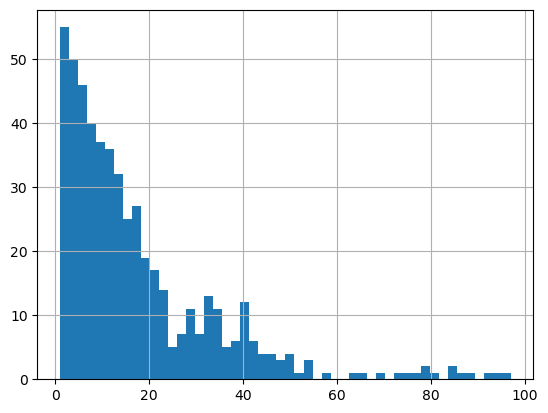

In [11]:
def val2_mean(x):
        return np.mean(np.array(x.tolist()), axis=0)



saccades_count_tw = (saccades
                        .query("times_onset > 0 & \
                                amp_tot > @sacc_minamp")
                        .assign(tw=lambda x:
                                    np.where((x["times_offset"] > tw_p1_start) & (x["times_onset"] < tw_p1_end), "p1",
                                    np.where((x["times_offset"] > tw_n170_start) & (x["times_onset"] < tw_n170_end), "n170",
                                    np.where((x["times_offset"] > tw_epn_start) & (x["times_onset"] < tw_epn_end), "epn",
                                    np.where((x["times_offset"] > tw_lpc_start) & (x["times_onset"] < tw_lpc_end), "lpc",
                                    "other"
                                    )))))
                        .query("tw != 'other'")
                        .assign(angle_polar = lambda x: list(zip(np.sin(x["angle"]), np.cos(x["angle"]))))
                        .assign(angle_sin = lambda x: np.sin(x["angle"]))
                        .assign(angle_cos = lambda x: np.cos(x["angle"]))
                        .merge(design_df, on=["sub_id", "trial_num"])
                        .groupby(["sub_id", "emotion", "viewcond", "trial_num", "tw"], as_index=False)
                        .agg({"vpeak": "count", "amp_tot": "mean", "angle_sin": "mean", "angle_cos": "mean", "angle_polar": val2_mean})
                        .rename(columns={"vpeak": "sacc_count"})
                        .sort_values(["sub_id", "trial_num"])
                        .merge(design_df, on=["sub_id", "emotion", "viewcond", "trial_num"], how="outer")
                        .fillna({"sacc_count": 0})
                        .sort_values(["sub_id", "trial_num"])
                        .reset_index(drop=True)
                        .groupby(["sub_id", "emotion", "tw", "viewcond"], as_index=False)
                        .agg({"sacc_count": "sum", "amp_tot": "mean", "angle_sin": "mean", "angle_cos": "mean", "angle_polar": val2_mean})
                        # .groupby(["emotion", "tw"], as_index=False)
                        # .agg({"sacc_count": ["mean", "std", "min", "max", ci_l, ci_u]})
)

saccades_count_tw.sacc_count.hist(bins=50)




In [12]:
def check_dispersion(results):
  # from https://python.plainenglish.io/a-step-by-step-guide-to-count-data-analysis-in-python-a981544fc4f0

  deviance_residuals = results.resid_deviance

  # Calculate residual deviance
  residual_deviance = sum(deviance_residuals)

  # Calculate degrees of freedom
  df = results.df_resid

  # Calculate the ratio
  ratio = residual_deviance / df

  # Display the ratio
  print("Residual Deviance to Degrees of Freedom Ratio:", ratio)
  if ratio > 1:
    print("Warning: The model is overdispersed.")

In [22]:
timings = TIMINGS()
erp_windows = timings.ERP_WINDOWS
tw_lengths = {tw.lower(): erp_windows[tw][1] - erp_windows[tw][0] for tw in erp_windows.keys()}

saccades_count_tw["window_length"] = saccades_count_tw["tw"].apply(lambda x: tw_lengths[x])
saccades_count_tw.head()

,sub_id,emotion,tw,viewcond,sacc_count,amp_tot,angle_sin,angle_cos,angle_polar,window_length
0,VR2FEM_S01,angry,epn,mono,18.0,2.623611,-0.046008,-0.589708,"[-0.046008134065272904, -0.589708276025029]",0.05
1,VR2FEM_S01,angry,epn,stereo,15.0,2.967855,-0.360832,-0.631781,"[-0.36083172811054115, -0.63178091882672]",0.05
2,VR2FEM_S01,angry,lpc,mono,19.0,2.665678,0.105263,0.618420,"[0.10526304476545945, 0.6184195150403321]",0.20
3,VR2FEM_S01,angry,lpc,stereo,24.0,2.642466,-0.362899,0.561518,"[-0.36289928369959795, 0.5615183022131655]",0.20
4,VR2FEM_S01,angry,n170,mono,9.0,2.798614,-0.345822,-0.663952,"[-0.34582150517985905, -0.6639515935347668]",0.07


### GLM: Number of saccades ~ Emotion * Viewing Condition * Time Window
Run GLM modelling the number of saccades (sum) as a function of Emotion, Viewcond, and Time Window:

In [27]:

formula_emo_tw_vc = "sacc_count ~ C(emotion, Treatment('neutral')) * C(viewcond, Treatment('mono')) * C(tw, Treatment('p1'))"
model_emo_tw_vc = glm(formula_emo_tw_vc,
                      data=saccades_count_tw,
                      family=sm.families.Poisson(),
                      offset=np.log(saccades_count_tw["window_length"]),
                      ).fit()
print(model_emo_tw_vc.summary())
print(model_emo_tw_vc.wald_test_terms(scalar=True))
print("\n")
check_dispersion(model_emo_tw_vc)
mod = model_emo_tw_vc.wald_test_terms(scalar=True)
mdf = mod.summary_frame().reset_index(drop=True)
mdf["Factor"] = ["Intercept", "Emotion", "Viewcond", "Time window", "Emotion:Viewcond", "Emotion:Time window", "Viewcond:Time window", "Emotion:Viewcond:Time window"]
mdf.set_index("Factor", inplace=True)
mdf

                 Generalized Linear Model Regression Results                  
Dep. Variable:             sacc_count   No. Observations:                  517
Model:                            GLM   Df Residuals:                      485
Model Family:                 Poisson   Df Model:                           31
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2763.7
Date:                Wed, 16 Apr 2025   Deviance:                       3333.1
Time:                        12:53:40   Pearson chi2:                 3.68e+03
No. Iterations:                     5   Pseudo R-squ. (CS):             0.8967
Covariance Type:            nonrobust                                         
                                                                                                                            coef    std err          z      P>|z|      [0.025      0.975]
------------------------

,chi2,P>chi2,df constraint
Factor,,,
Intercept,1948.999481,0.000000e+00,1
Emotion,2.415737,4.907120e-01,3
Viewcond,1.473101,2.248571e-01,1
Time window,115.813726,6.150233e-25,3
Emotion:Viewcond,1.050514,7.890316e-01,3
Emotion:Time window,4.803167,8.511180e-01,9
Viewcond:Time window,3.979863,2.636468e-01,3
Emotion:Viewcond:Time window,3.082237,9.609450e-01,9


Now a GLM modelling the saccade amplitude:

                 Generalized Linear Model Regression Results                  
Dep. Variable:                amp_tot   No. Observations:                  517
Model:                            GLM   Df Residuals:                      485
Model Family:                Gaussian   Df Model:                           31
Link Function:                    Log   Scale:                         0.31697
Method:                          IRLS   Log-Likelihood:                -420.59
Date:                Fri, 21 Mar 2025   Deviance:                       153.73
Time:                        12:03:59   Pearson chi2:                     154.
No. Iterations:                     6   Pseudo R-squ. (CS):            0.03154
Covariance Type:            nonrobust                                         
                                                                                                                            coef    std err          z      P>|z|      [0.025      0.975]
------------------------

/u/fklotzsche/conda-envs/vr2fem/lib/python3.10/site-packages/statsmodels/base/model.py:1912: FutureWarning: The behavior of wald_test will change after 0.14 to returning scalar test statistic values. To get the future behavior now, set scalar to True. To silence this message while retaining the legacy behavior, set scalar to False.
  warnings.warn(


,chi2,P>chi2,df constraint
Factor,,,
Intercept,342.629600,1.706856e-76,1
Emotion,5.271593,1.529564e-01,3
Viewcond,0.053635,8.168547e-01,1
Time window,0.757932,8.595003e-01,3
Emotion:Viewcond,4.272364,2.335160e-01,3
Emotion:Time window,5.171537,8.191058e-01,9
Viewcond:Time window,1.037000,7.923001e-01,3
Emotion:Viewcond:Time window,4.336397,8.879106e-01,9


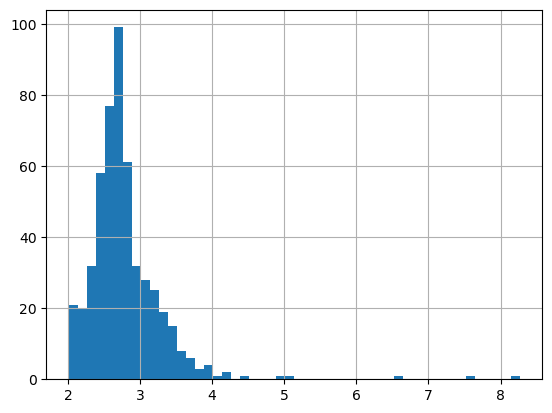

In [18]:
saccades_count_tw.amp_tot.hist(bins=50)

formula_emo_tw_vc = "amp_tot ~ C(emotion, Treatment('neutral')) * C(viewcond, Treatment('mono')) * C(tw, Treatment('p1'))"
model_emo_tw_vc = glm(formula_emo_tw_vc, data=saccades_count_tw, family=sm.families.Gaussian(link=sm.families.links.Log())).fit()
print(model_emo_tw_vc.summary())
print(model_emo_tw_vc.wald_test_terms())
print("\n")
check_dispersion(model_emo_tw_vc)

mod = model_emo_tw_vc.wald_test_terms(scalar=True)
mdf = mod.summary_frame().reset_index(drop=True)
mdf["Factor"] = ["Intercept", "Emotion", "Viewcond", "Time window", "Emotion:Viewcond", "Emotion:Time window", "Viewcond:Time window", "Emotion:Viewcond:Time window"]
mdf.set_index("Factor", inplace=True)
mdf

In [29]:



formula_emo = "angle_sin + angle_cos ~ C(emotion, Treatment('neutral'))" #  * C(tw, Treatment('p1'))"
# model_emo = MANOVA.from_formula(formula_emo, data=saccades_count_tw, family=sm.families.Gaussian())
# print(model_emo.mv_test())

# formula_emo_tw = "angle_sin + angle_cos ~ C(emotion, Treatment('neutral')) * C(tw, Treatment('p1'))" #  * C(tw, Treatment('p1'))"
# model_emo_tw = MANOVA.from_formula(formula_emo_tw, data=saccades_count_tw, family=sm.families.Gaussian())
# print(model_emo_tw.mv_test())

formula_emo_vc_tw = "angle_sin + angle_cos ~ C(emotion, Treatment('neutral')) * C(viewcond) * C(tw, Treatment('p1'))"
model_emo_vc_tw = MANOVA.from_formula(formula_emo_vc_tw, data=saccades_count_tw, family=sm.families.Gaussian())
print(model_emo_vc_tw.mv_test())


                                         Multivariate linear model
                                                                                                           
--------------------------------------------------------------------------------------------------------------------
                 Intercept                 Value           Num DF           Den DF           F Value          Pr > F
--------------------------------------------------------------------------------------------------------------------
                    Wilks' lambda          0.9953          2.0000          484.0000           1.1382          0.3213
                   Pillai's trace          0.0047          2.0000          484.0000           1.1382          0.3213
           Hotelling-Lawley trace          0.0047          2.0000          484.0000           1.1382          0.3213
              Roy's greatest root          0.0047          2.0000          484.0000           1.1382          0.3213
------

In [24]:
# horizontal gaze:
erp_windows = timings.ERP_WINDOWS
time_wins = list(erp_windows.keys())
time_wins = [tw.lower() for tw in time_wins]

# As the data is "unbalanced" (not for all combinations there were actually saccades), we fill it up with NAs:

prodfactors = ["sub_id", "emotion", "viewcond", "tw"]
uniques = [saccades_count_tw.loc[:,s].unique() for s in prodfactors]
fulldesign = pd.DataFrame(product(*uniques), columns=prodfactors)

saccades_count_tw_full = (fulldesign
                            .merge(saccades_count_tw, on=["sub_id", "emotion", "viewcond", "tw"], how="left")
)

run_rmanova_and_posthoc(df_aov=saccades_count_tw_full,
                        depvar="angle_cos",
                        within=["emotion", "tw", "viewcond"],
                        posthoc_dim="tw",
                        posthoc_levels=time_wins,
                        subject="sub_id")

                      Anova
                    F Value Num DF  Den DF  Pr > F
--------------------------------------------------
emotion                 nan 3.0000  48.0000    nan
tw                      nan 3.0000  48.0000    nan
viewcond                nan 1.0000  16.0000    nan
emotion:tw              nan 9.0000 144.0000    nan
emotion:viewcond        nan 3.0000  48.0000    nan
tw:viewcond             nan 3.0000  48.0000    nan
emotion:tw:viewcond     nan 9.0000 144.0000    nan

p1 vs n170: t = 5.15, p = 0.000
p1 vs epn: t = 11.55, p = 0.000
p1 vs lpc: t = -0.65, p = 1.000
n170 vs epn: t = 5.93, p = 0.000
n170 vs lpc: t = -4.69, p = 0.000
epn vs lpc: t = -11.95, p = 0.000


In [23]:
saccades_count_tw_full

,sub_id,emotion,viewcond,tw,sacc_count,amp_tot,angle_sin,angle_cos,angle_polar
0,VR2FEM_S01,angry,mono,epn,18.0,2.623611,-0.046008,-0.589708,"[-0.046008134065272904, -0.589708276025029]"
1,VR2FEM_S01,angry,mono,lpc,19.0,2.665678,0.105263,0.618420,"[0.10526304476545945, 0.6184195150403321]"
2,VR2FEM_S01,angry,mono,n170,9.0,2.798614,-0.345822,-0.663952,"[-0.34582150517985905, -0.6639515935347668]"
3,VR2FEM_S01,angry,mono,p1,2.0,2.636312,-0.159336,-0.509501,"[-0.15933596766299013, -0.509501434608413]"
4,VR2FEM_S01,angry,stereo,epn,15.0,2.967855,-0.360832,-0.631781,"[-0.36083172811054115, -0.63178091882672]"
...,...,...,...,...,...,...,...,...,...
539,VR2FEM_S31,surprised,mono,p1,4.0,7.624542,0.083177,-0.401548,"[0.08317749328488351, -0.4015484758085319]"
540,VR2FEM_S31,surprised,stereo,epn,16.0,2.779132,0.324590,-0.273843,"[0.3245903059321115, -0.27384300088369806]"
541,VR2FEM_S31,surprised,stereo,lpc,33.0,2.671555,-0.133079,-0.263277,"[-0.13307871093499868, -0.26327666475332895]"
542,VR2FEM_S31,surprised,stereo,n170,14.0,2.650108,0.047040,0.111443,"[0.04703978130645084, 0.11144300390233976]"


In [165]:
uniques = [saccades_count_tw.loc[:,s].unique() for s in ["sub_id", "emotion", "viewcond", "tw"]]
uniques

[array(['VR2FEM_S01', 'VR2FEM_S02', 'VR2FEM_S03', 'VR2FEM_S05',
        'VR2FEM_S07', 'VR2FEM_S08', 'VR2FEM_S10', 'VR2FEM_S11',
        'VR2FEM_S12', 'VR2FEM_S13', 'VR2FEM_S15', 'VR2FEM_S16',
        'VR2FEM_S19', 'VR2FEM_S21', 'VR2FEM_S24', 'VR2FEM_S25',
        'VR2FEM_S31'], dtype=object),
 array(['angry', 'happy', 'neutral', 'surprised'], dtype=object),
 array(['mono', 'stereo'], dtype=object),
 array(['epn', 'lpc', 'n170', 'p1'], dtype=object)]

In [ ]:

sub_list_str = saccades_count_tw.sub_id.unique()
emo_list_str = saccades_count_tw.emotion.unique()
viewcond_list_str = saccades_count_tw.viewcond.unique()
tw_list_str = saccades_count_tw.tw.unique()

fullprod = pd.DataFrame(product(sub_list_str, emo_list_str, viewcond_list_str, tw_list_str))
fullprod.columns = ["sub_id", "emotion", "viewcond", "tw"]

saccades_count_tw_full = (fullprod
                            .merge(saccades_count_tw, on=["sub_id", "emotion", "viewcond", "tw"], how="left")
)

saccades_count_tw_full


,sub_id,emotion,viewcond,tw,sacc_count,amp_tot,angle_sin,angle_cos,angle_polar
0,VR2FEM_S01,angry,mono,epn,18.0,2.623611,-0.046008,-0.589708,"[-0.046008134065272904, -0.589708276025029]"
1,VR2FEM_S01,angry,mono,lpc,19.0,2.665678,0.105263,0.618420,"[0.10526304476545945, 0.6184195150403321]"
2,VR2FEM_S01,angry,mono,n170,9.0,2.798614,-0.345822,-0.663952,"[-0.34582150517985905, -0.6639515935347668]"
3,VR2FEM_S01,angry,mono,p1,2.0,2.636312,-0.159336,-0.509501,"[-0.15933596766299013, -0.509501434608413]"
4,VR2FEM_S01,angry,stereo,epn,15.0,2.967855,-0.360832,-0.631781,"[-0.36083172811054115, -0.63178091882672]"
...,...,...,...,...,...,...,...,...,...
539,VR2FEM_S31,surprised,mono,p1,4.0,7.624542,0.083177,-0.401548,"[0.08317749328488351, -0.4015484758085319]"
540,VR2FEM_S31,surprised,stereo,epn,16.0,2.779132,0.324590,-0.273843,"[0.3245903059321115, -0.27384300088369806]"
541,VR2FEM_S31,surprised,stereo,lpc,33.0,2.671555,-0.133079,-0.263277,"[-0.13307871093499868, -0.26327666475332895]"
542,VR2FEM_S31,surprised,stereo,n170,14.0,2.650108,0.047040,0.111443,"[0.04703978130645084, 0.11144300390233976]"


In [168]:
saccades_count_tw.groupby(["emotion", "tw", "sub_id"], as_index=False).agg({"amp_tot": ["mean", "std", "min", "max"]})

emotion   tw      sub_id   amp_tot                              
                                     mean       std       min       max
0        angry  epn  VR2FEM_S01  2.795733  0.243418  2.623611  2.967855
1        angry  epn  VR2FEM_S02  2.947181  0.132425  2.853542  3.040819
2        angry  epn  VR2FEM_S03  2.835516  0.129809  2.743728  2.927305
3        angry  epn  VR2FEM_S05  3.009898  0.360921  2.754688  3.265107
4        angry  epn  VR2FEM_S07  2.649706  0.062017  2.605853  2.693558
..         ...  ...         ...       ...       ...       ...       ...
259  surprised   p1  VR2FEM_S19  2.012144       NaN  2.012144  2.012144
260  surprised   p1  VR2FEM_S21  2.157219       NaN  2.157219  2.157219
261  surprised   p1  VR2FEM_S24  2.311022  0.248514  2.135297  2.486748
262  surprised   p1  VR2FEM_S25  3.281982  0.144509  3.179798  3.384165
263  surprised   p1  VR2FEM_S31  5.031658  3.666892  2.438774  7.624542

[264 rows x 7 columns]